In [15]:
include("/Users/meesvandartel/Desktop/Coursework/CGT/DeepEWA/FastEWA.jl")
using Flux, .fEWA, Random, IterTools, ProgressMeter, DataFrames, CSV, Statistics

In [16]:
# this data will be for this specific coordination game with 2 NE and 1 mixed NE.
coord = [[[5 1; 1 4], [5 1; 1 4]], fEWA.find_NE_mixed([[5 1; 1 4], [5 1; 1 4]])]
dom = [[[5 0; 20 1], [5 0; 20 1]], fEWA.find_NE_mixed([[5 0; 20 1], [5 0; 20 1]])]
cyclic = [[[5 1;1 4],[-5 1; 1 -4]], fEWA.find_NE_mixed([[5 1;1 4],[-5 1; 1 -4]])]

game = coord
points = 50000 

α_grid = rand(0.0:0.0001:1.0, points) 
κ_grid = rand(0.0:0.0001:1.0, points)
δ_grid = rand(0.0:0.0001:1.0, points)
β_grid = exp.(rand(0.0:0.001:2.5, points)) # take exp to get the lim to infty effect since β is unbounded above
# combs = [[α_grid[i], κ_grid[i], δ_grid[i], β_grid[i]] for i in 1:points]

#testing
combs = [[0.0, 1.0, δ_grid[i], β_grid[i]] for i in 1:points]

subset=Int64(floor(0.6*length(combs))) #60/40 train test split, since we have many obs

x_train, x_test = combs[1:subset], combs[(subset+1):end]
y_train, y_test = Vector{Bool}(undef, length(x_train)),Vector{Bool}(undef, length(x_test))
println("Finished")

Finished


In [17]:
# should take about 6min for 1mil obs
@showprogress for i in 1:length(x_train)
    comb=x_train[i]
    α, κ, δ, β = comb
    params = fEWA.init_EWA(;α=α, κ=κ, δ=δ, β=β,game=game)
    sₜ, σ, Qₜ, NE_found  = fEWA.Run_FastEWA(params)
    y_train[i] = NE_found
end

@showprogress for i in 1:length(x_test)
    comb = x_test[i]
    α, κ, δ, β = comb
    params = fEWA.init_EWA(;α=α, κ=κ, δ=δ, β=β,game=game)
    _, _, _, NE_found  = fEWA.Run_FastEWA(params)
    y_test[i] = NE_found
end

Progress: 100%|█████████████████████████████████████████| Time: 0:01:10
Progress: 100%|█████████████████████████████████████████| Time: 0:00:45


In [18]:
x_train = hcat([Float32.(x[1:4]) for x in x_train]...)

DeepEWA= Chain(
    Dense(4 => 32, relu),
    Dense(32 => 32, relu),
    Dense(32 => 2))

out1 = DeepEWA(x_train)
probs1 = softmax(out1)


target = Flux.onehotbatch(y_train, [true, false])
loader = Flux.DataLoader((x_train, target), batchsize=64, shuffle=true);

opt_state = Flux.setup(Flux.AdaGrad(), DeepEWA)

losses=[]
@showprogress for epoch in 1:2000
    for xy in loader
        x,y = xy
        loss, grads = Flux.withgradient(DeepEWA) do m
            y_hat = m(x)
            Flux.logitcrossentropy(y_hat, y)
        end
        Flux.update!(opt_state, DeepEWA, grads[1])
        push!(losses, loss)
    end
end

opt_state

Progress: 100%|█████████████████████████████████████████| Time: 0:00:49


(layers = ((weight = Leaf(AdaGrad(eta=0.1, epsilon=1.0e-8), Float32[1.0f-8 414.084 173.774 12205.9; 1.0f-8 1.85888f-5 1.32246f-5 2.21046f-5; … ; 1.0f-8 966.354 343.348 23167.6; 1.0f-8 1.0f-8 1.0f-8 1.0f-8]), bias = Leaf(AdaGrad(eta=0.1, epsilon=1.0e-8), Float32[414.084, 1.85888f-5, 6523.27, 1.0f-8, 1.0f-8, 1.0f-8, 1974.42, 459.867, 0.106326, 1.0f-8  …  385.978, 3.0564f-5, 678.082, 0.0519708, 20622.0, 749.766, 1.0f-8, 1.0f-8, 966.354, 1.0f-8]), σ = ()), (weight = Leaf(AdaGrad(eta=0.1, epsilon=1.0e-8), Float32[0.740886 7.29712f-8 … 16.7951 1.0f-8; 108.226 4.9751f-8 … 8.65082 1.0f-8; … ; 16.8074 5.18992f-8 … 62.3982 1.0f-8; 0.0033172 1.0f-8 … 0.000203251 1.0f-8]), bias = Leaf(AdaGrad(eta=0.1, epsilon=1.0e-8), Float32[114.086, 700.145, 8.42974, 0.0795319, 0.136729, 296.339, 1.0f-8, 1912.64, 2.88987f-6, 722.392  …  8.70388f-7, 0.268358, 0.000160163, 994.955, 6.0641f-7, 0.000488315, 41.6476, 1682.18, 420.89, 0.00486962]), σ = ()), (weight = Leaf(AdaGrad(eta=0.1, epsilon=1.0e-8), Float32[44.0

In [19]:
x_test = hcat([Float32.(x[1:4]) for x in x_test]...)

out2 = DeepEWA(x_test)
probs2 = softmax(out2)
mean((probs2[1,:].>0.5).==y_test)

0.72115

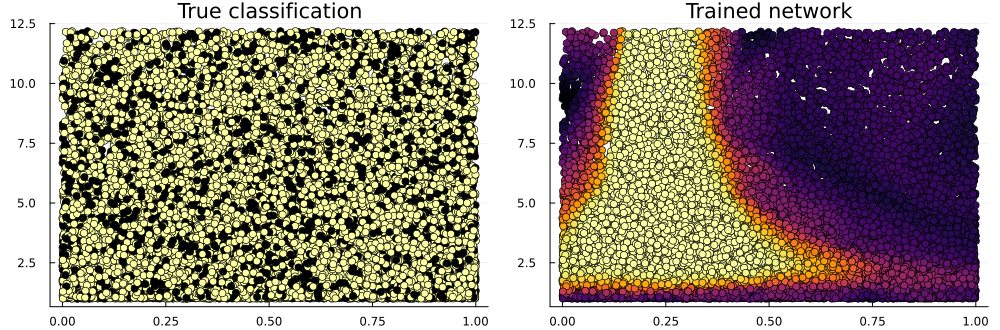

In [20]:
using Plots  # to draw the above figure

p_true = scatter(x_test[3,:], x_test[4,:], zcolor=y_train, title="True classification", legend=false)
p_done = scatter(x_test[3,:], x_test[4,:], zcolor=probs2[1,:], title="Trained network", legend=false)

plot(p_true, p_done, layout=(1,2), size=(1000,330))


In [21]:

#=
plot(losses; xaxis=(:log10, "iteration"),
    yaxis="loss", label="per batch")
n = length(loader)
plot!(n:n:length(losses), mean.(Iterators.partition(losses, n)),
    label="epoch mean", dpi=200)
    =#
